# **Proyecto 2 c3**

* Daniel Bernal

**Intencion:**

El siguiente proyecto tiene la intención de evaluar la efectividad del método K-means en el análisis y agrupamiento de imágenes mediante el planteamiento de pasos y preguntas clave para identificar patrones comunes y diferencias significativas dentro de los datos. A partir de dos conjuntos de imágenes con características específicas, se busca explorar el impacto de distintas configuraciones de agrupamiento y su capacidad para capturar la estructura subyacente de los datos visuales.

**Enfoque:**

Este análisis se enfoca en aspectos como la elección del número óptimo de clústeres mediante el método del codo y el coeficiente de silueta, lo que permite identificar configuraciones que logren un equilibrio entre la separación de los grupos y la complejidad del modelo. Además, se evalúan las imágenes promedio generadas para cada clúster, proporcionando una representación visual de las características predominantes en los datos y sus agrupamientos.

Este documento también concluye sobre las limitaciones encontradas en el procesamiento de datos de alta dimensionalidad, como la confusión de imágenes en clústeres incorrectos debido a factores como similitudes visuales, pérdida de información en la transformación de los datos, y la representación de características que no capturan completamente el contenido visual. A partir de este análisis, se busca aportar una comprensión más profunda sobre los retos y las oportunidades en la aplicación de K-means para problemas de clasificación visual complejos.

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score
import matplotlib.cm as cm
from sklearn.metrics import silhouette_samples
import matplotlib.colors as mcolors
import numpy as np
from sklearn.metrics import pairwise_distances_argmin_min
from PIL import Image

In [ ]:
df = pd.read_csv('/content/processed_images.csv')
df.drop(columns=["image_name"], inplace=True)
df.head()

,0,1,2,3,4,5,6,7,8,9,...,49142,49143,49144,49145,49146,49147,49148,49149,49150,49151
0,207,208,210,207,209,209,208,209,209,208,...,37.0,33.0,36.0,39.0,32.0,35.0,39.0,32.0,35.0,40.0
1,228,229,233,229,229,234,229,230,234,229,...,41.0,35.0,36.0,41.0,38.0,40.0,45.0,39.0,41.0,46.0
2,218,222,225,219,223,225,219,223,225,219,...,168.0,161.0,169.0,158.0,163.0,170.0,160.0,169.0,175.0,165.0
3,231,235,238,231,235,238,232,236,238,233,...,180.0,177.0,184.0,171.0,129.0,137.0,125.0,163.0,171.0,160.0
4,230,235,238,230,235,238,231,236,239,231,...,177.0,186.0,194.0,185.0,190.0,199.0,190.0,174.0,180.0,173.0


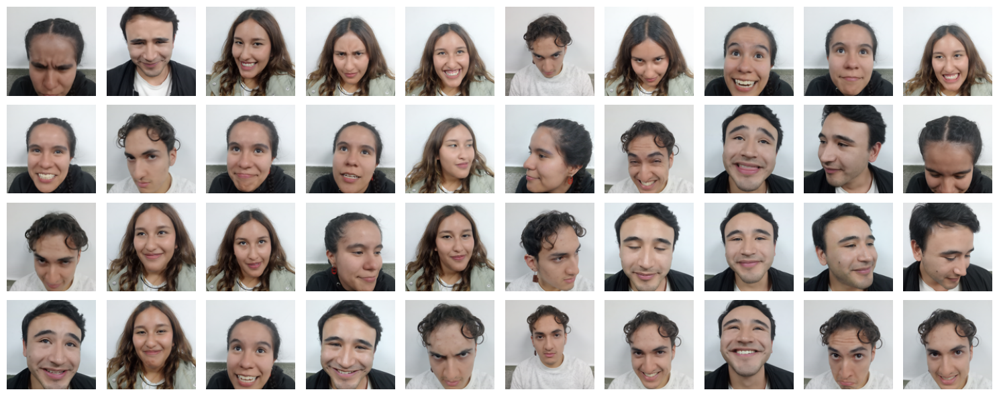

In [ ]:
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

df = pd.read_csv('/content/processed_images.csv')
df.drop(columns=["image_name"], inplace=True)

# Definir el número de columnas
num_columns = 10

# Función para mostrar las imágenes
def show_images_in_grid(df, num_columns=10):
    num_images = len(df)
    num_rows = (num_images // num_columns) + (num_images % num_columns > 0)  # Número de filas necesarias

    # Crear la figura
    fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, num_rows * 1.5))

    # Aplanar la matriz de ejes
    axes = axes.flatten()

    for index, (row, ax) in enumerate(zip(df.iterrows(), axes)):
        if index < num_images:
            # Redimensionar los datos de píxeles
            pixel_data = np.array(row[1]).reshape(128, 128, 3)
            image = Image.fromarray(pixel_data.astype('uint8'), 'RGB')

            ax.imshow(image)
            ax.axis('off')  # Ocultar los ejes
        else:
            ax.axis('off')  # Si no hay más imágenes, ocultar los ejes

    plt.tight_layout()
    plt.show()

show_images_in_grid(df, num_columns)


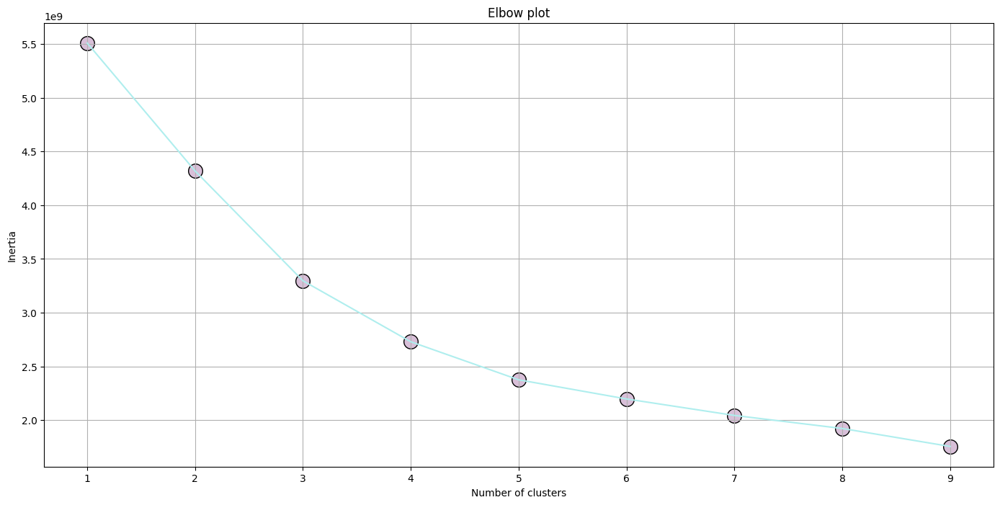

In [ ]:
def plot_elbow(X, number_clusters=10):
    inertias = []
    for i in range(1, number_clusters):
        km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=300, random_state=0)
        km.fit(X)
        inertias.append(km.inertia_)

    fig, ax = plt.subplots(figsize=(17, 8))
    ax.scatter(range(1, number_clusters), inertias, marker='o', edgecolor='black', s=200, color='thistle')
    ax.plot(range(1, number_clusters), inertias, color='paleturquoise')
    ax.set_xlabel('Number of clusters')
    ax.set_ylabel('Inertia')
    ax.set_title('Elbow plot')
    ax.grid()
    return ax

X1 = df
plot_elbow(X1)
plt.show()

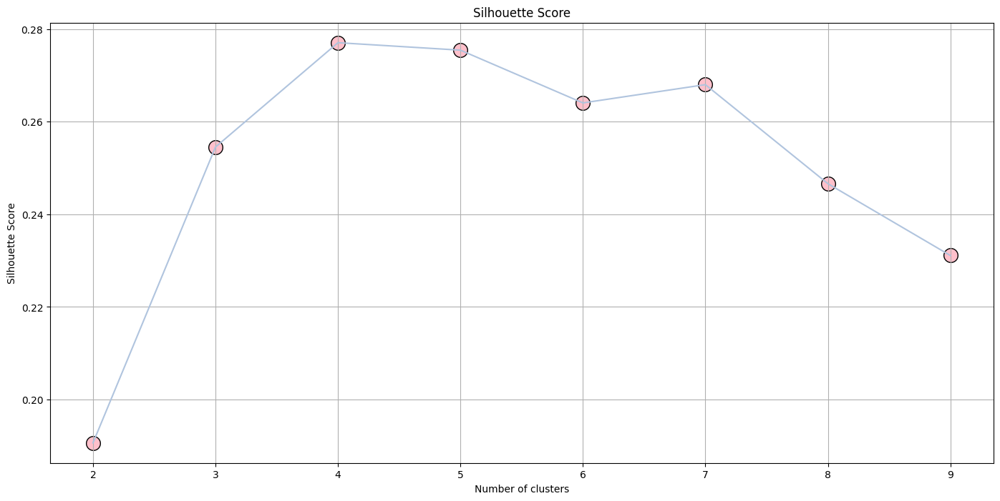

In [ ]:
def plot_silhouette_score(X1, number_clusters=10):
    scores = []
    for i in range(2, number_clusters):
        km = KMeans(n_clusters=i, init='k-means++', n_init=11, max_iter=300, random_state=0)
        km.fit(X1)
        scores.append(silhouette_score(X1, km.labels_))

    fig, ax = plt.subplots(figsize=(17, 8))
    ax.scatter(range(2, number_clusters), scores, marker='o', edgecolor='black', s=200, color='pink')
    ax.plot(range(2, number_clusters), scores, color='lightsteelblue')
    ax.set_xlabel('Number of clusters')
    ax.set_ylabel('Silhouette Score')
    ax.set_title('Silhouette Score')
    ax.grid()
    return ax

plot_silhouette_score(X1)
plt.show()

Analizando para n_clusters = 2


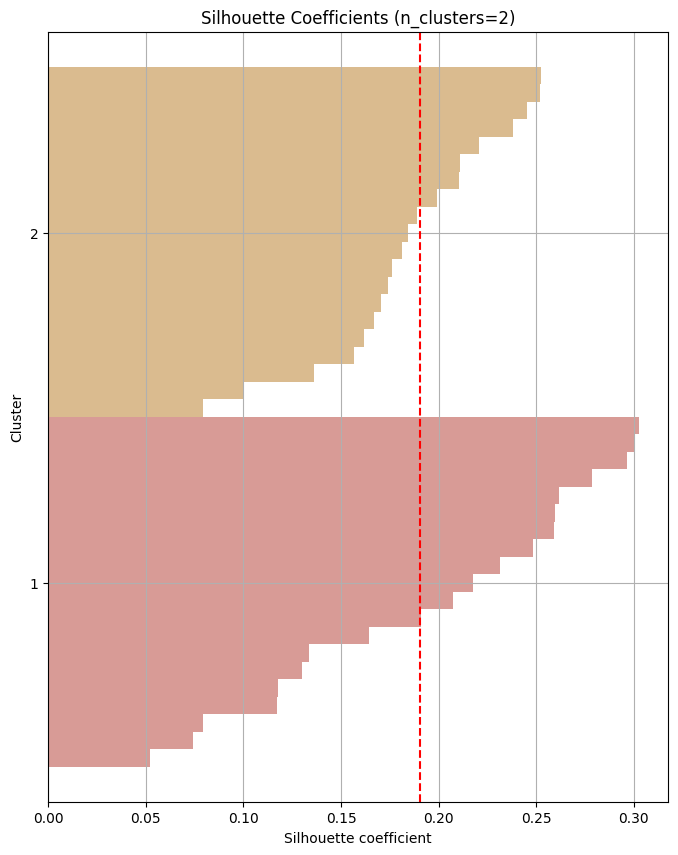

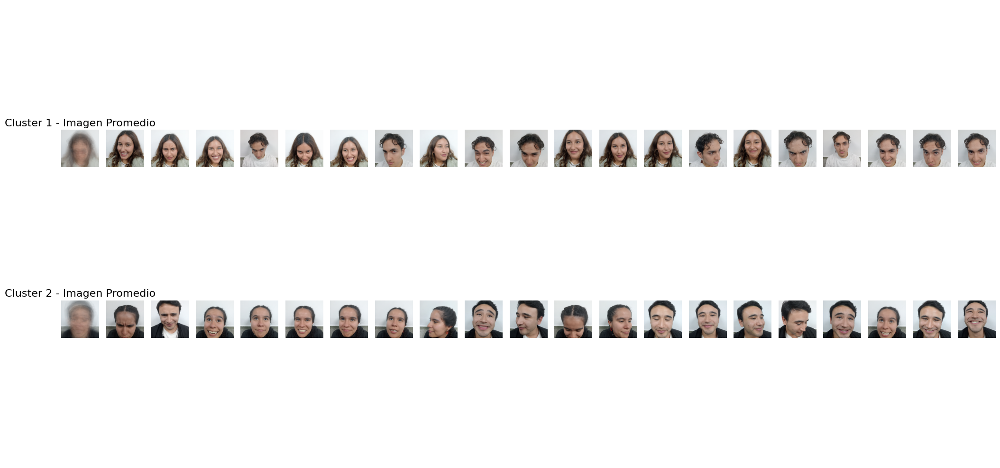

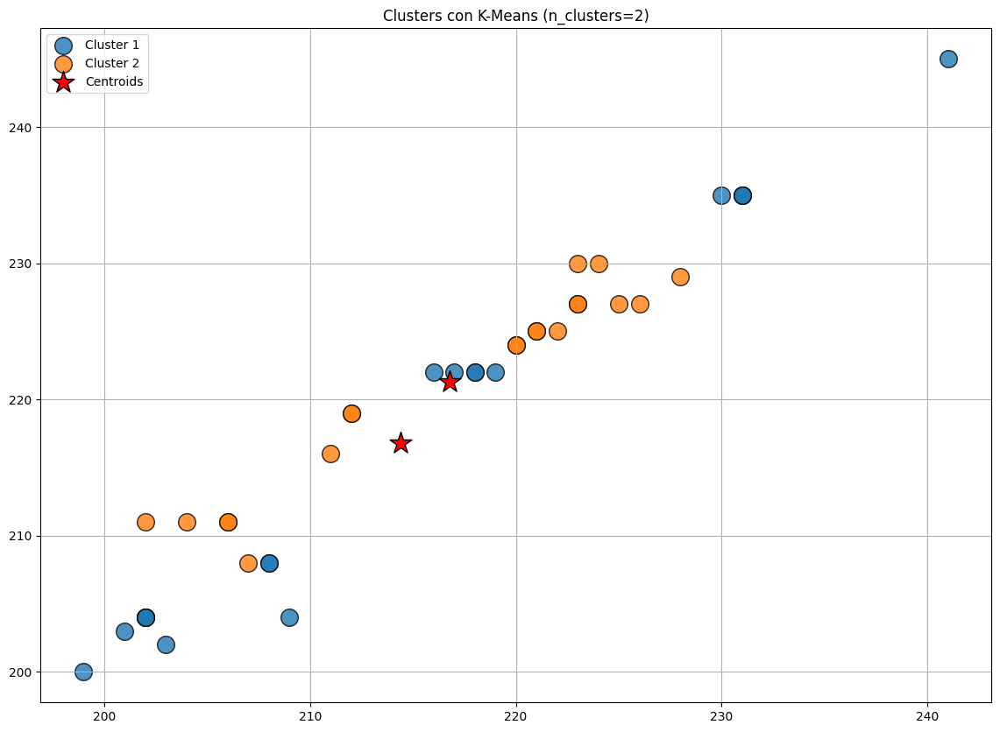

Analizando para n_clusters = 4


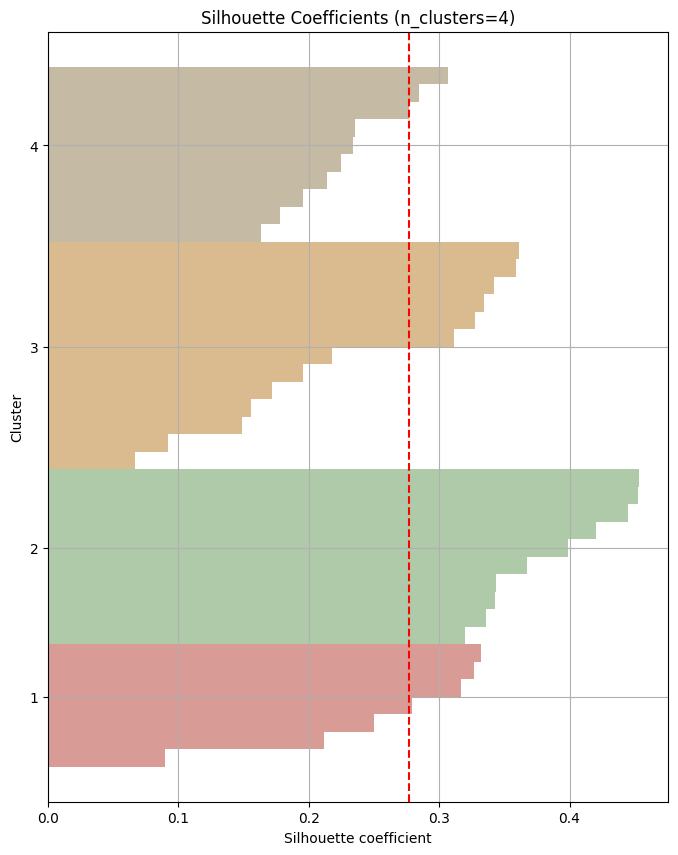

<ipython-input-8-db7508dec762>:112: UserWarning: tight_layout not applied: number of columns in subplot specifications must be multiples of one another.
  plt.tight_layout()


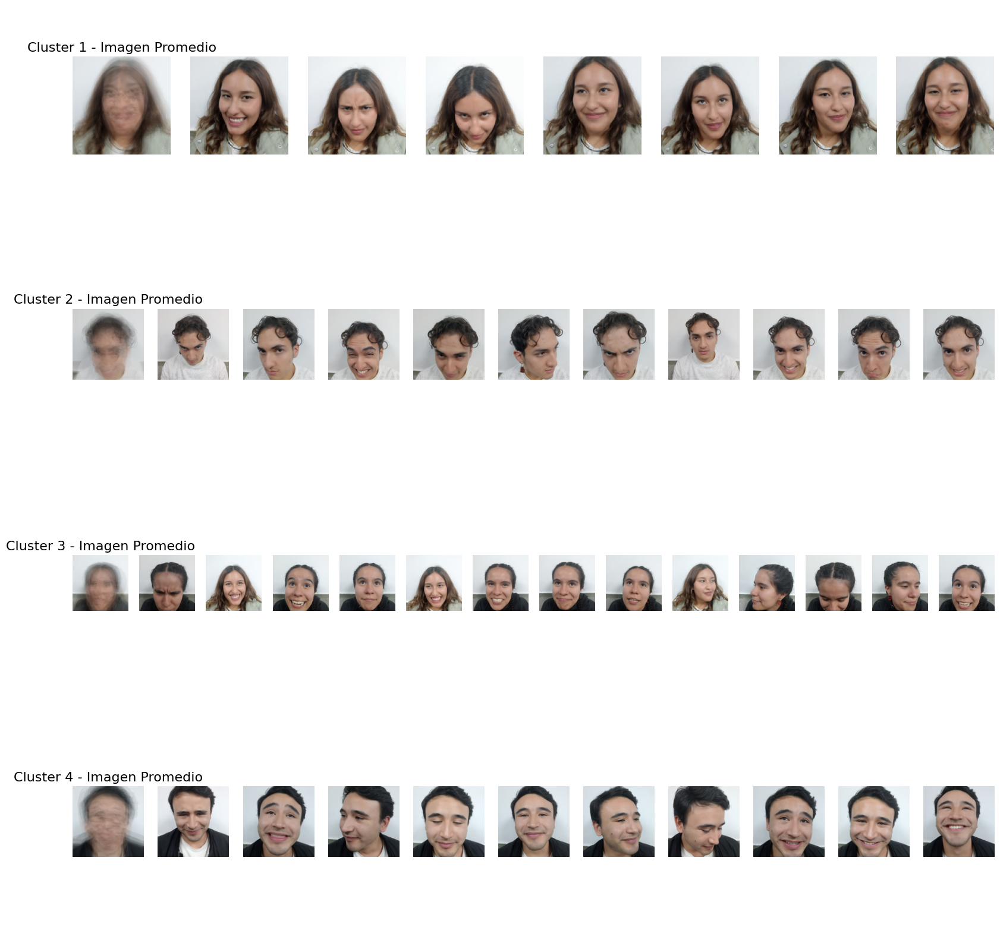

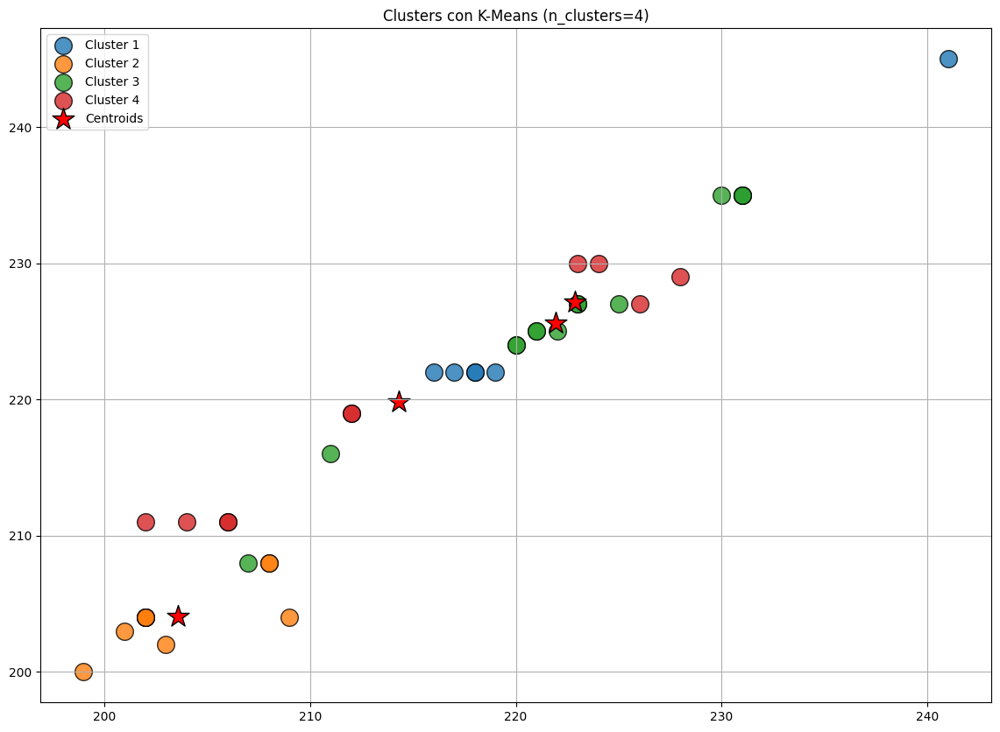

Analizando para n_clusters = 5


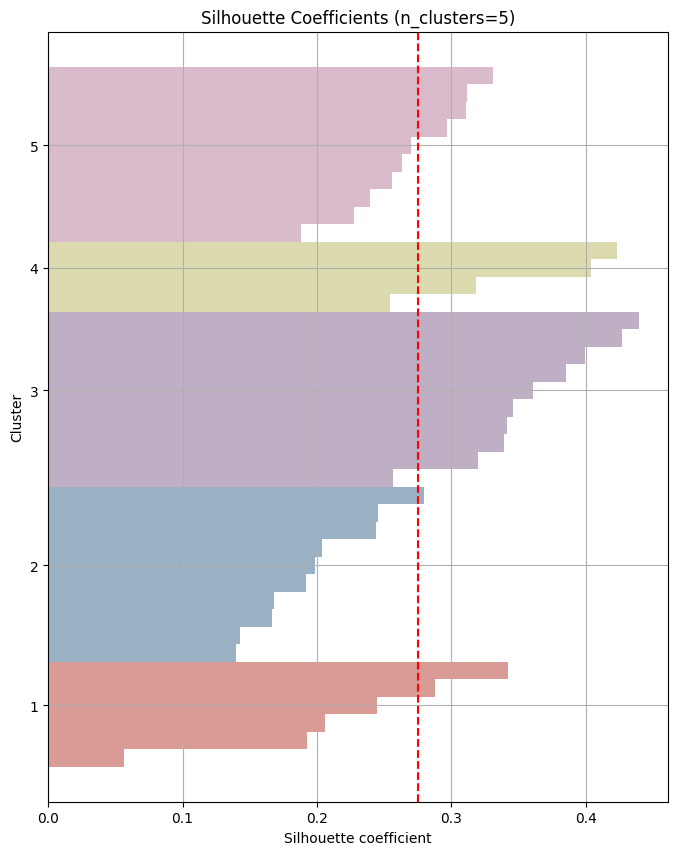

<ipython-input-8-db7508dec762>:112: UserWarning: tight_layout not applied: number of columns in subplot specifications must be multiples of one another.
  plt.tight_layout()


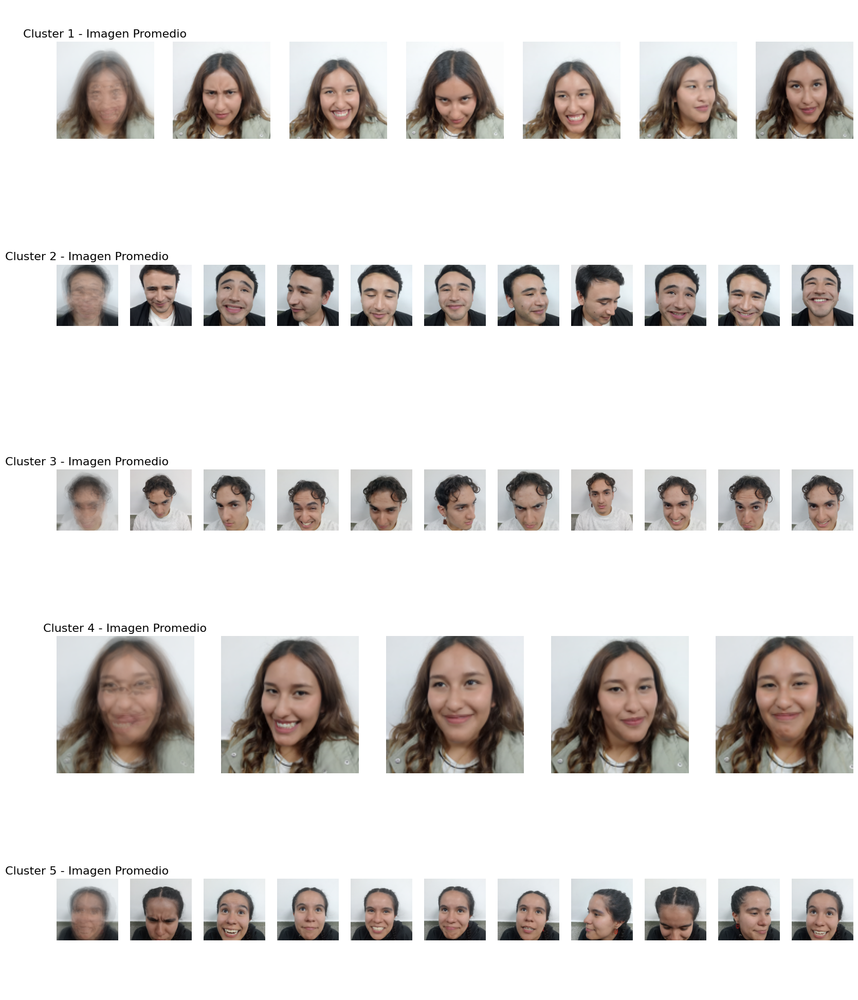

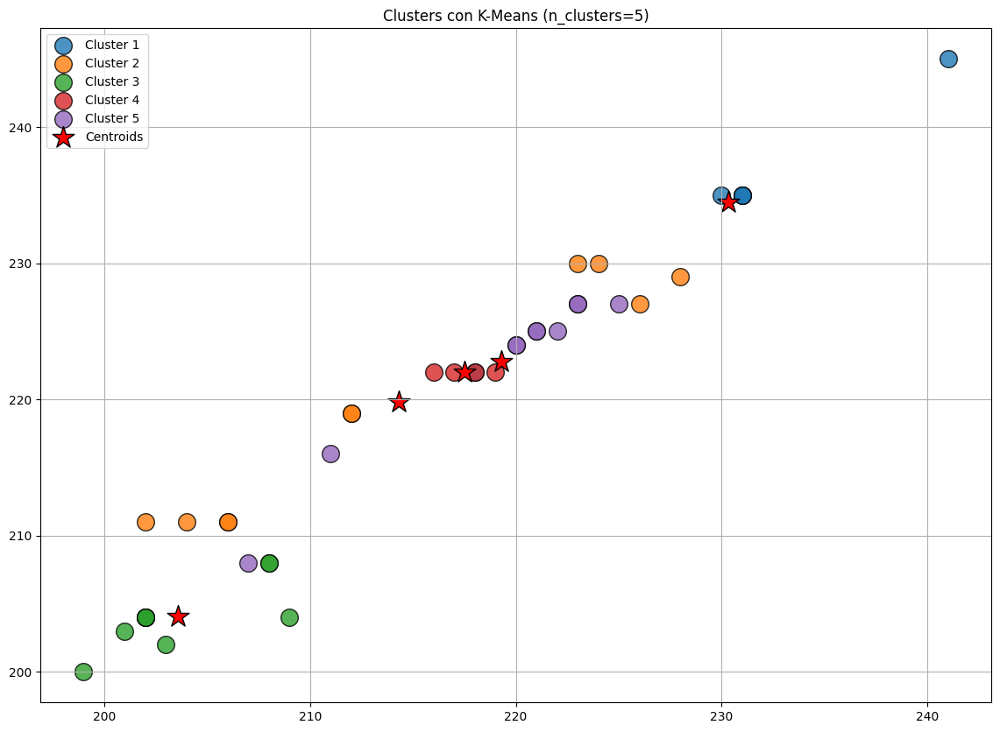

In [ ]:
from sklearn.metrics import silhouette_samples
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# Lista de valores de n_clusters a probar
n_clusters_probar = [2, 4, 5]

# Asegúrate de que X1 esté en el formato adecuado (n_imagenes, 128 * 128 * 3)
X1_flat = X1.values.reshape(X1.shape[0], -1)  # Aplana cada imagen

# Función para graficar el coeficiente de silueta para cada n_clusters
def plot_silhouette_coeficient(X1_flat, n_clusters):
    km = KMeans(n_clusters=n_clusters, init='k-means++', n_init=10, max_iter=300, tol=1e-04, random_state=0)
    y_km = km.fit_predict(X1_flat)
    cluster_labels = np.unique(y_km)
    silhouette_vals = silhouette_samples(X1_flat, y_km, metric='euclidean')
    y_ax_lower, y_ax_upper = 0, 0
    yticks = []

    # Ajustar el tamaño de la figura
    plt.figure(figsize=(8, 10))

    for i, c in enumerate(cluster_labels):
        c_silhouette_vals = silhouette_vals[y_km == c]
        c_silhouette_vals.sort()
        y_ax_upper += len(c_silhouette_vals)

        # Colores personalizados
        color = cm.Pastel1(float(i) / n_clusters)
        color_darker = (color[0] * 0.86, color[1] * 0.86, color[2] * 0.86)
        plt.barh(range(y_ax_lower, y_ax_upper), c_silhouette_vals, height=1.0, edgecolor='none', color=color_darker)

        yticks.append((y_ax_lower + y_ax_upper) / 2.0)
        y_ax_lower += len(c_silhouette_vals)

    silhouette_avg = np.mean(silhouette_vals)
    plt.axvline(silhouette_avg, color="red", linestyle="--")
    plt.yticks(yticks, cluster_labels + 1)
    plt.ylabel('Cluster')
    plt.xlabel('Silhouette coefficient')
    plt.title(f'Silhouette Coefficients (n_clusters={n_clusters})')
    plt.grid()
    plt.show()

# Función para graficar clusters en 2D con centroides
def plot_clusters(X1, predictions, centroids, n_clusters):
    colors = list(mcolors.TABLEAU_COLORS.keys())
    fig, ax = plt.subplots(figsize=(14, 10))

    for index in range(n_clusters):
        # Utiliza el índice módulo la longitud de la lista de colores para reutilizarlos
        color = colors[index % len(colors)]
        ax.scatter(X1[predictions == index, 0],
                   X1[predictions == index, 1],
                   s=200,
                   c=color,
                   marker='o',
                   edgecolor='black',
                   alpha=0.8,
                   label=f'Cluster {index + 1}'
                  )

    # Grafica los centroides
    ax.scatter(centroids[:, 0],
               centroids[:, 1],
               s=350, marker='*',
               c='red', edgecolor='black',
               label='Centroids')
    ax.set_title(f'Clusters con K-Means (n_clusters={n_clusters})')
    ax.grid()
    ax.legend()
    plt.show()

# Función para calcular y graficar clusters con imagen promedio e imágenes asociadas
def calcular_y_graficar_clusters(X1, X1_flat, n_clusters):
    km = KMeans(n_clusters=n_clusters, n_init=10, max_iter=300, tol=1e-04, random_state=0)
    y_km = km.fit_predict(X1_flat)
    centroids = km.cluster_centers_

    # Calcular promedios de imagen para cada cluster
    X1_reshaped = X1.values.reshape(-1, 128, 128, 3)
    promedios = []
    for cluster in range(n_clusters):
        imagenes_cluster = X1_reshaped[y_km == cluster]
        promedio = np.mean(imagenes_cluster, axis=0)
        promedios.append(promedio)

    # Graficar clusters con imagen promedio e imágenes asociadas
    fig, axes = plt.subplots(n_clusters, 1, figsize=(20, 5 * n_clusters))
    for i in range(n_clusters):
        cluster_indices = np.where(y_km == i)[0]
        n_imagenes = len(cluster_indices)
        n_cols = n_imagenes + 1
        row_axes = axes[i] if n_clusters > 1 else axes
        row_axes.axis('off')

        # Coloca el promedio al inicio de la fila
        ax_promedio = fig.add_subplot(n_clusters, n_cols, i * n_cols + 1)
        ax_promedio.imshow(promedios[i].astype(int))
        ax_promedio.axis('off')
        ax_promedio.set_title(f'Cluster {i + 1} - Imagen Promedio', fontsize=16)

        # Coloca todas las imágenes asociadas a este cluster en la misma fila
        for j, idx in enumerate(cluster_indices):
            ax = fig.add_subplot(n_clusters, n_cols, i * n_cols + j + 2)
            ax.imshow(X1_reshaped[idx].astype(int))
            ax.axis('off')

    plt.tight_layout()
    plt.show()

    # Llama a la función para graficar los clusters en 2D con centroides
    plot_clusters(X1_flat[:, :2], y_km, centroids[:, :2], n_clusters)

# Ejecutar el análisis para cada valor en n_clusters_probar
for n_clusters in n_clusters_probar:
    print(f"Analizando para n_clusters = {n_clusters}")
    plot_silhouette_coeficient(X1_flat, n_clusters)
    calcular_y_graficar_clusters(X1, X1_flat, n_clusters)


**Conclusiones de la parte 1:**

El primer dataset contiene un conjunto de imagenes de 128*128 las cuales se encuentran en 3 canales RGB. Se realizan las transformaciones necesarias para poder analizar con kmeans obteniendo como resultado filas de 49151 caracteristicas.  En el ejercicio podemos evidenciar:

*   El método del codo se utilizó para identificar el número óptimo de clústeres. La gráfica muestra una reducción significativa en la inercia inicial (hasta 4 clústeres), tras lo cual las mejoras disminuyen. Esto indica que entre 3 y 5 clústeres son apropiados para capturar la estructura subyacente de los datos.
*   Con la ayuda del coeficiente de Silueta, se analizaron distintos valores de clústeres (2, 4 y 5), observando la separación de los grupos formados.
Para 2 clústeres, el coeficiente promedio de silueta fue alto, lo que indica una buena separación inicial.
Con 4 y 5 clústeres, la calidad del agrupamiento disminuyó ligeramente, lo que puede sugerir redundancia o similitud entre ciertos grupos.
*   Se calcularon y visualizaron las imágenes promedio para cada clúster. Estas promedios ayudan a identificar características generales, como brillo y tonalidades dominantes, que diferencian los grupos.
La representación de las imágenes asociadas a cada clúster reveló que los datos tienen patrones visuales distintivos, aunque algunos clústeres parecen contener ejemplos más heterogéneos.




In [ ]:
df2 = pd.read_csv('/content/filtro_images.csv')
df2.drop(columns=["image_name"], inplace=True)
df2

,0,1,2,3,4,5,6,7,8,9,...,49142,49143,49144,49145,49146,49147,49148,49149,49150,49151
0,220,224,225,220,224,225,220,224,225,221,...,52,37,43,50,21,26,34,16,20,29
1,220,224,225,220,224,225,220,224,225,221,...,166,172,173,158,167,166,150,167,163,145
2,221,225,227,221,226,227,221,226,227,221,...,166,173,181,168,177,185,172,182,188,175
3,209,213,216,209,213,216,209,214,216,210,...,72,48,56,71,48,55,71,50,57,72
4,206,210,213,206,211,213,206,211,212,206,...,54,30,38,52,28,36,50,33,41,54
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115,224,228,231,224,229,230,224,230,230,225,...,59,130,108,57,130,106,54,115,95,50
116,246,248,245,246,248,245,246,248,245,247,...,63,47,55,67,51,60,72,55,65,77
117,233,237,238,233,237,238,233,237,238,233,...,67,49,57,72,45,55,69,40,50,63
118,204,209,212,204,209,212,204,209,212,205,...,62,37,46,61,37,47,61,37,46,60


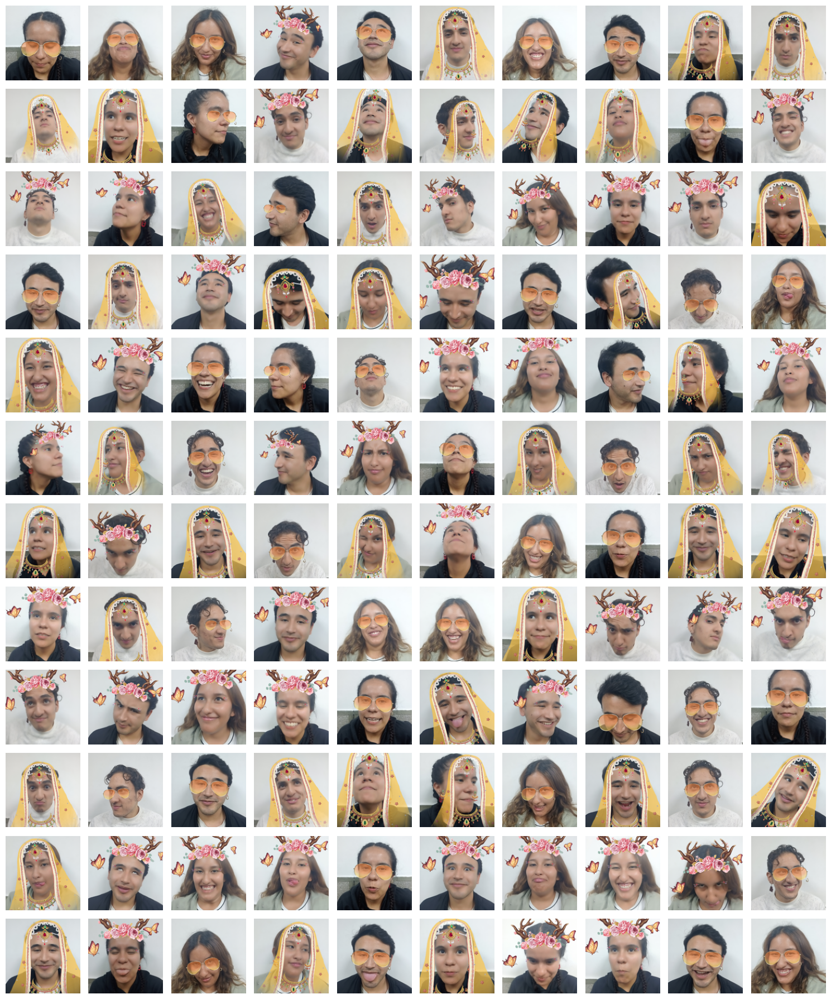

In [ ]:
# Definir el número de columnas
num_columns = 10

# Función para mostrar las imágenes
def show_images_in_grid(df2, num_columns=10):
    num_images = len(df2)
    num_rows = (num_images // num_columns) + (num_images % num_columns > 0)  # Número de filas necesarias

    # Crear la figura
    fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, num_rows * 1.5))

    # Aplanar la matriz de ejes
    axes = axes.flatten()

    for index, (row, ax) in enumerate(zip(df2.iterrows(), axes)):
        if index < num_images:
            # Redimensionar los datos de píxeles
            pixel_data = np.array(row[1]).reshape(128, 128, 3)
            image = Image.fromarray(pixel_data.astype('uint8'), 'RGB')

            ax.imshow(image)
            ax.axis('off')  # Ocultar los ejes
        else:
            ax.axis('off')  # Si no hay más imágenes, ocultar los ejes

    plt.tight_layout()
    plt.show()

show_images_in_grid(df2, num_columns)

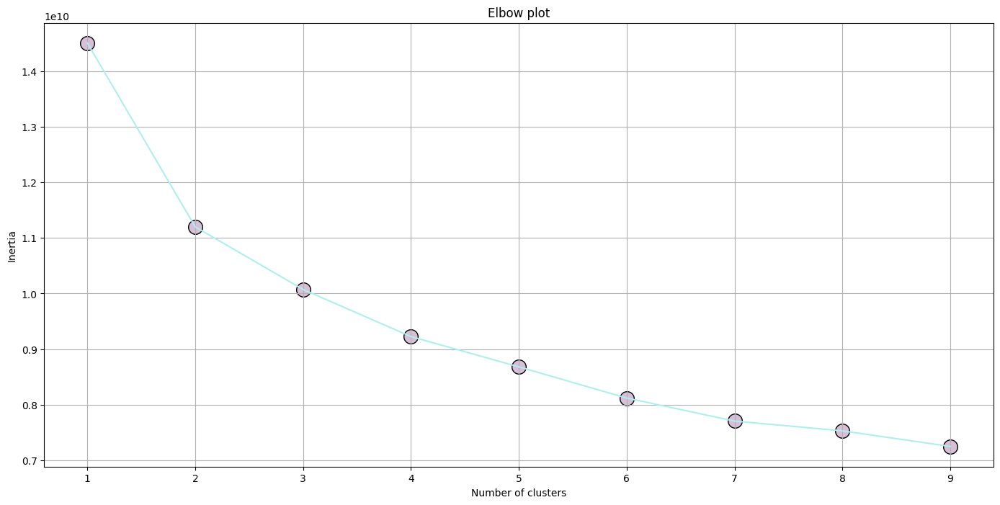

In [ ]:
def plot_elbow(X, number_clusters=10):
    inertias = []
    for i in range(1, number_clusters):
        km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=300, random_state=0)
        km.fit(X)
        inertias.append(km.inertia_)

    fig, ax = plt.subplots(figsize=(17, 8))
    ax.scatter(range(1, number_clusters), inertias, marker='o', edgecolor='black', s=200, color='thistle')
    ax.plot(range(1, number_clusters), inertias, color='paleturquoise')
    ax.set_xlabel('Number of clusters')
    ax.set_ylabel('Inertia')
    ax.set_title('Elbow plot')
    ax.grid()
    return ax

X = df2
plot_elbow(X)
plt.show()

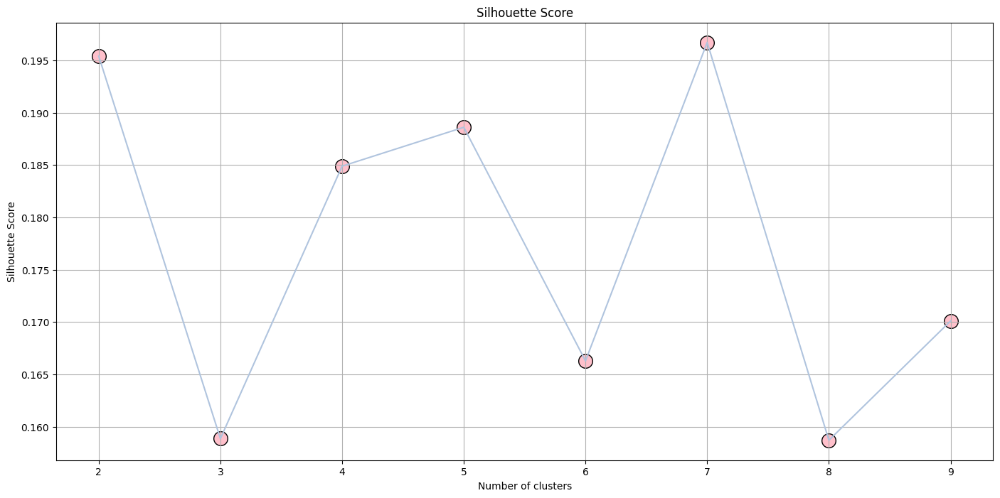

In [ ]:
def plot_silhouette_score(X, number_clusters=10):
    scores = []
    for i in range(2, number_clusters):
        km = KMeans(n_clusters=i, init='k-means++', n_init=11, max_iter=300, random_state=0)
        km.fit(X)
        scores.append(silhouette_score(X, km.labels_))

    fig, ax = plt.subplots(figsize=(17, 8))
    ax.scatter(range(2, number_clusters), scores, marker='o', edgecolor='black', s=200, color='pink')
    ax.plot(range(2, number_clusters), scores, color='lightsteelblue')
    ax.set_xlabel('Number of clusters')
    ax.set_ylabel('Silhouette Score')
    ax.set_title('Silhouette Score')
    ax.grid()
    return ax
plot_silhouette_score(X)
plt.show()

In [ ]:
from sklearn.metrics import silhouette_samples
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# Lista de valores de n_clusters a probar
n_clusters_probar = [2, 4, 7]

# Asegúrate de que X1 esté en el formato adecuado (n_imagenes, 128 * 128 * 3)
X1_flat = X.values.reshape(X.shape[0], -1)  # Aplana cada imagen
X1 = X

# Función para graficar el coeficiente de silueta para cada n_clusters
def plot_silhouette_coeficient(X1_flat, n_clusters):
    km = KMeans(n_clusters=n_clusters, init='k-means++', n_init=10, max_iter=300, tol=1e-04, random_state=0)
    y_km = km.fit_predict(X1_flat)
    cluster_labels = np.unique(y_km)
    silhouette_vals = silhouette_samples(X1_flat, y_km, metric='euclidean')
    y_ax_lower, y_ax_upper = 0, 0
    yticks = []

    # Ajustar el tamaño de la figura
    plt.figure(figsize=(8, 10))

    for i, c in enumerate(cluster_labels):
        c_silhouette_vals = silhouette_vals[y_km == c]
        c_silhouette_vals.sort()
        y_ax_upper += len(c_silhouette_vals)

        # Colores personalizados
        color = cm.Pastel1(float(i) / n_clusters)
        color_darker = (color[0] * 0.86, color[1] * 0.86, color[2] * 0.86)
        plt.barh(range(y_ax_lower, y_ax_upper), c_silhouette_vals, height=1.0, edgecolor='none', color=color_darker)

        yticks.append((y_ax_lower + y_ax_upper) / 2.0)
        y_ax_lower += len(c_silhouette_vals)

    silhouette_avg = np.mean(silhouette_vals)
    plt.axvline(silhouette_avg, color="red", linestyle="--")
    plt.yticks(yticks, cluster_labels + 1)
    plt.ylabel('Cluster')
    plt.xlabel('Silhouette coefficient')
    plt.title(f'Silhouette Coefficients (n_clusters={n_clusters})')
    plt.grid()
    plt.show()

# Función para graficar clusters en 2D con centroides
def plot_clusters(X1, predictions, centroids, n_clusters):
    colors = list(mcolors.TABLEAU_COLORS.keys())
    fig, ax = plt.subplots(figsize=(14, 10))

    for index in range(n_clusters):
        color = colors[index % len(colors)]
        ax.scatter(X1[predictions == index, 0],
                   X1[predictions == index, 1],
                   s=200,
                   c=color,
                   marker='o',
                   edgecolor='black',
                   alpha=0.8,
                   label=f'Cluster {index + 1}')

    # Grafica los centroides
    ax.scatter(centroids[:, 0],
               centroids[:, 1],
               s=350, marker='*',
               c='red', edgecolor='black',
               label='Centroids')
    ax.set_title(f'Clusters con K-Means (n_clusters={n_clusters})')
    ax.grid()
    ax.legend()
    plt.show()

# Función para calcular y graficar clusters con imagen promedio e imágenes asociadas
def calcular_y_graficar_clusters(X1, X1_flat, n_clusters):
    km = KMeans(n_clusters=n_clusters, n_init=10, max_iter=300, tol=1e-04, random_state=0)
    y_km = km.fit_predict(X1_flat)
    centroids = km.cluster_centers_

    # Calcular promedios de imagen para cada cluster
    X1_reshaped = X1.values.reshape(-1, 128, 128, 3)
    promedios = []
    for cluster in range(n_clusters):
        imagenes_cluster = X1_reshaped[y_km == cluster]
        promedio = np.mean(imagenes_cluster, axis=0)
        promedios.append(promedio)

    # Graficar clusters con imagen promedio e imágenes asociadas
    for i in range(n_clusters):
        cluster_indices = np.where(y_km == i)[0]
        n_imagenes = len(cluster_indices)

        # Determinar el número de columnas y filas necesarias
        n_cols = 10  # Máximo 10 columnas
        n_rows = (n_imagenes // n_cols) + 1

        fig, axes = plt.subplots(n_rows, n_cols + 1, figsize=(20, 5 * n_rows))
        fig.suptitle(f'Cluster {i + 1} - Imágenes Asociadas', fontsize=16)

        # Asegurarse de que axes sea un arreglo 2D
        if len(axes.shape) == 1:
            axes = np.expand_dims(axes, axis=0)

        # Coloca el promedio al inicio de la primera columna de la primera fila
        ax_promedio = axes[0, 0]
        ax_promedio.imshow(promedios[i].astype(int))
        ax_promedio.axis('off')
        ax_promedio.set_title('Imagen Promedio')

        # Coloca todas las imágenes asociadas al cluster
        for j, idx in enumerate(cluster_indices):
            row, col = divmod(j + 1, n_cols + 1)
            ax = axes[row, col]
            ax.imshow(X1_reshaped[idx].astype(int))
            ax.axis('off')

        # Ocultar ejes vacíos
        for row in range(n_rows):
            for col in range(n_cols + 1):
                if row * (n_cols + 1) + col > n_imagenes:
                    axes[row, col].axis('off')

        plt.tight_layout()
        plt.show()

    # Llama a la función para graficar los clusters en 2D con centroides
    plot_clusters(X1_flat[:, :2], y_km, centroids[:, :2], n_clusters)

# Ejecutar el análisis para cada valor en n_clusters_probar
for n_clusters in n_clusters_probar:
    print("---------------------------")
    print(f"Analizando para n_clusters = {n_clusters}")
    print("---------------------------")
    plot_silhouette_coeficient(X1_flat, n_clusters)
    calcular_y_graficar_clusters(X1, X1_flat, n_clusters)


**Conclusiones de la parte 2:**

Al igual que con el punto anterior, se utilizo un dataset de imagenes de 128*128 con 3 canales, se hizo el mismo proceso para que el dataset pudiese ser usado con kmeans. En el ejercicio podemos evidenciar:



*   Con la grafica de codo podemos evidenciar que la inercia disminuye rápidamente hasta los 4 clústeres y se estabiliza gradualmente después. Esto confirma que un número óptimo de clústeres estaría en el rango de 3 a 4.
*   Con el coeficiente de silueta podemos evidenciar que con 2 clústeres, los coeficientes de silueta indicaron una buena separación entre los grupos.
Para 4 clústeres, hubo una ligera disminución en la calidad del agrupamiento, pero los grupos siguieron siendo bien diferenciados.
En 7 clústeres, el coeficiente promedio se redujo notablemente, lo que sugiere una sobresegmentación.
*   Al igual que en el primer dataframe, se generaron imágenes promedio y visualizaciones de los clústeres en un espacio reducido (2D).
Se observó que los clústeres presentan mayor homogeneidad visual, lo que podría indicar que el proceso de filtrado seleccionó imágenes con características más distintivas.



Tanto para el primer como el segundo dataframe, el rango óptimo de clústeres es de 3 a 5. Esto proporciona un balance entre la separación de grupos y la complejidad del modelo.

En este caso el uso del PCA puede no llegar a ser beneficioso debido a que en pruebas anteriormente realizadas tanto la grafica de codo como el coeficiente de siluetas presentaban un pesimo rendimiento en la separacion de cada uno de los grupos. sumado a que en la representacion visual de los mismos tendia a confundir las imagenes

La confusión de algunas imágenes al ser asignadas a un clúster incorrecto puede atribuirse a varios factores tales como los datos, o la representación de las características, entre esos posibles factores estan:


*   Algunas imágenes pueden compartir características visuales similares, como colores, niveles de brillo o texturas, que dificultan la diferenciación.
*   Dado que las imágenes tienen 49152 dimensiones, esto aumenta la posibilidad de que algunas imágenes tengan características similares por coincidencia, aun si pertenecen a categorías distintas.
*   Al transformar una imagen en una matriz plana, algunas características como la distribucion de los objetos o caracteristicas en el espacio se pierdan. Esto provoca que imágenes con contenido visual distinto pero similares en términos de valores de píxeles sean confundidas.
